# BioTrillion Coding Challenge - CVL1

## Importing libraries

In [1]:
import numpy as np
import argparse
import cv2 as cv
import os
import imutils
from matplotlib import pyplot as plt
from scipy.spatial import distance as dist
from imutils import perspective
from imutils import contours
from math import sqrt
import random

## Import modules from python files

In [2]:
from paths import *
from load_images import *
from plot import *
from tools import *

## Load images 

Describing images...
['./data/eye_5.jpg', './data/eye_4.jpg', './data/eye_6.jpg', './data/eye_3.jpg', './data/eye_2.jpg', './data/eye_1.jpg']
Image dimensions:  (2160, 3840, 3)
Images loaded : 6


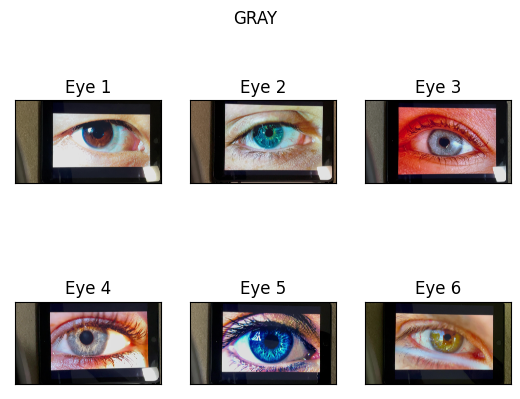

In [3]:
print("Describing images...")
imagePaths = list(list_images('./data'))
print(imagePaths)

# Load bgr and rgb images 
rgbImages, bgrImages = load_raw_images(imagePaths)

# Image dimensions
print("Image dimensions: ", rgbImages[0].shape)

# Load gray images 
grayImages = load_gray_images(rgbImages, 7)

print(f"Images loaded : {len(rgbImages)}")

plot_images(rgbImages, 'gray', 'GRAY')


## Try transformation on the images 

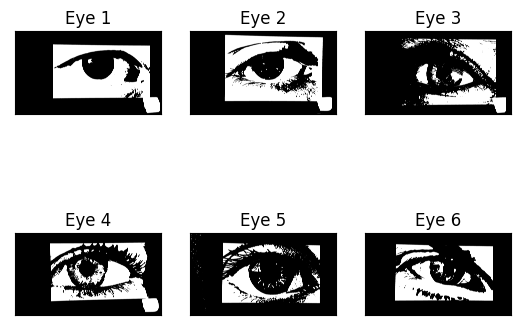

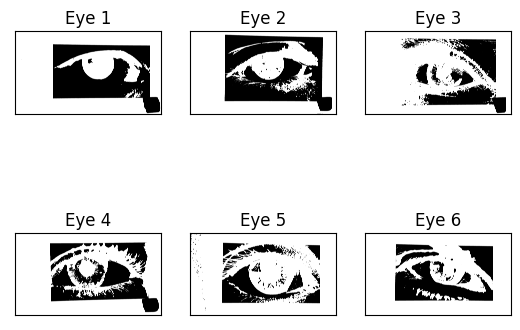

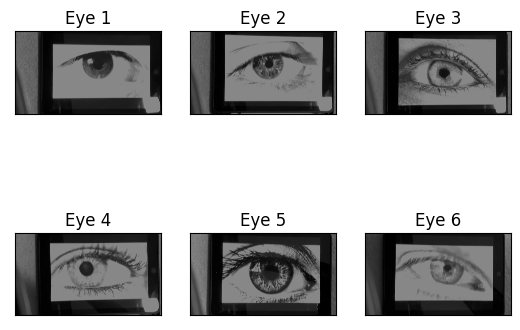

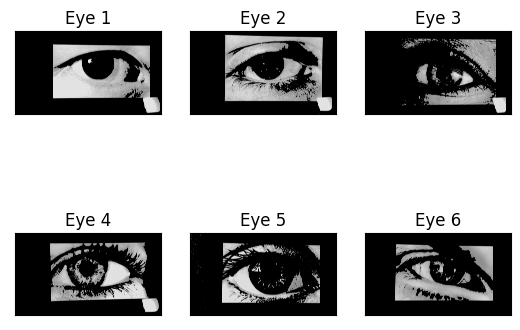

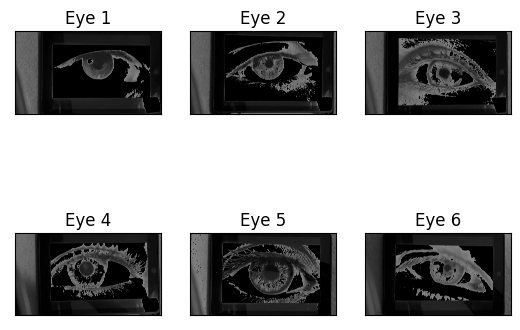

In [4]:
# threshdoldImages
method = cv.THRESH_BINARY_INV
threshdoldImages = threshdold_images(grayImages, method)

#plot_images(threshdoldImages, 'gray')

# multiple thresholds
methods = [cv.THRESH_BINARY, cv.THRESH_BINARY_INV, cv.THRESH_TRUNC, cv.THRESH_TOZERO, cv.THRESH_TOZERO_INV]
for method in methods:
    threshdoldImages = threshdold_images(grayImages, 135, method)
    plot_images(threshdoldImages, 'gray', str(method)[3:])

THRESH_BINARY and THRESH_BINARY_INV could be used to detect the pupil (black hole) but also the sclera to detect the borders of the iris.

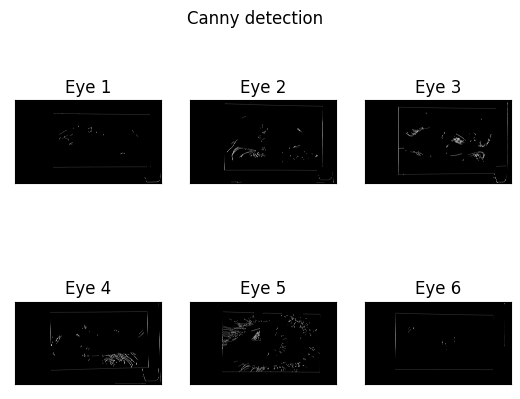

In [5]:
# Setting parameters for edge detection
t_lower = 0  # Lower Threshold
t_upper = 150  # Upper threshold
aperture_size = 5  # Aperture size
edgedImages = canny_detection(grayImages, t_lower, t_upper, aperture_size)
plot_images(edgedImages, 'gray', 'Canny detection')

# threshdoldImages
method = cv.THRESH_BINARY
thres = 140
threshdoldImages = threshdold_images(grayImages, thres, method)
edged_threshdold_images = canny_detection(threshdoldImages, t_lower, t_upper, aperture_size)
#plot_images(edged_threshdold_images, 'gray', 'Canny detection + Threshold')

Canny detection seems to be complex to handle.

## Find diameter of the pupil

In [6]:
def draw_box(edged, original, minArea:int=16000, maxArea:int=600000):
	# get contours in the edge map
	cnts = cv.findContours(edged.copy(), cv.RETR_TREE,
	cv.CHAIN_APPROX_NONE)
	cnts = imutils.grab_contours(cnts)

	# sort the contours from left-to-right 
	(cnts, _) = contours.sort_contours(cnts)

	# loop over the contours individually
	for c in cnts:
		# if the contour is not sufficiently large or too large, ignore it
		if cv.contourArea(c) < minArea or cv.contourArea(c) > maxArea:
			continue
			
		approx = cv.approxPolyDP(c, .03 * cv.arcLength(c, True), True)
		k=cv.isContourConvex(approx)
		if len(approx) < 6: 
			continue

		# compute the rotated bounding box of the contour
		orig = original.copy()
		box = cv.minAreaRect(c)
		box = cv.cv.BoxPoints(box) if imutils.is_cv2() else cv.boxPoints(box)
		box = np.array(box, dtype="int")

		

		# order the points in the contour such that they appear
		# in top-left, top-right, bottom-right, and bottom-left
		# order, then draw the outline of the rotated bounding
		# box
		box = perspective.order_points(box)
		(tl, tr, br, bl) = box
		if (distance(tl, tr) >= 1.5* distance(tr, br)) or (distance(tr, br) >= 1.5*distance(tl, tr)):
			continue
		cv.drawContours(orig, [box.astype("int")], -1, (0, 255, 0), 20)
		diam = int((distance(tl, tr) + distance(tr, br))/2)
		
		plt.axis('off')
		plt.imshow(cv.cvtColor(orig, cv.COLOR_BGR2RGB))
		plt.title(f"Pupil diameter : {diam} pixels")
		plt.show()

In [7]:
def get_pupil(image):
    # Convert the image to grayscale format
   img_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
   #img_gray = cv.GaussianBlur(img_gray, (3, 3), 0)

   # Visualize the gray image
   plt.axis('off')
   plt.imshow(cv.cvtColor(img_gray, cv.COLOR_BGR2RGB))
   plt.show()

   # Apply binary thresholding
   ret, thresh = cv.threshold(img_gray, 40, 255, cv.THRESH_BINARY_INV)

   # Visualize the threshold image
   plt.axis('off')
   plt.imshow(cv.cvtColor(thresh, cv.COLOR_BGR2RGB))
   #plt.show()

   # Different transformations to have cleaner images
   thresh = erode_image(thresh, kernel(15), 3)
   thresh = erode_image(thresh, kernel(5), 3)
   thresh = dilate_image(thresh, kernel(15), 5)
   thresh = erode_image(thresh, kernel(15), 2)
   thresh = dilate_image(thresh, kernel(5), 10)
   thresh = erode_image(thresh, kernel(15), 2)
   thresh = erode_image(thresh, kernel(5), 5)


   # Visualize the threshold cleaned image
   plt.axis('off')
   plt.imshow(cv.cvtColor(thresh, cv.COLOR_BGR2RGB))
   #plt.show()

   # Detect the contours on the binary image using cv.CHAIN_APPROX_NONE
   cnts, hierarchy = cv.findContours(image=thresh, mode=cv.RETR_TREE, method=cv.CHAIN_APPROX_NONE)
                                       
   # Draw contours on the original image
   image_contour = image.copy()
   cv.drawContours(image=image_contour, contours=cnts, contourIdx=-1, color=(0, 255, 0), thickness=20, lineType=cv.LINE_AA)
                  
   # see the results
   plt.axis('off')
   plt.imshow(cv.cvtColor(image_contour, cv.COLOR_BGR2RGB))
   #plt.show()

   draw_box(thresh, image, minArea=12000, maxArea=600000)

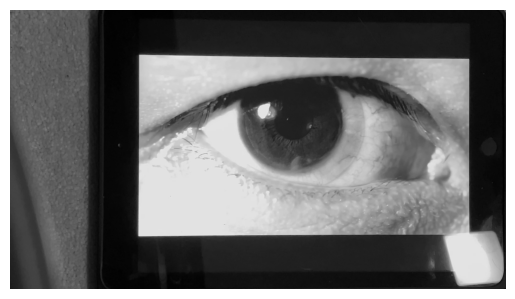

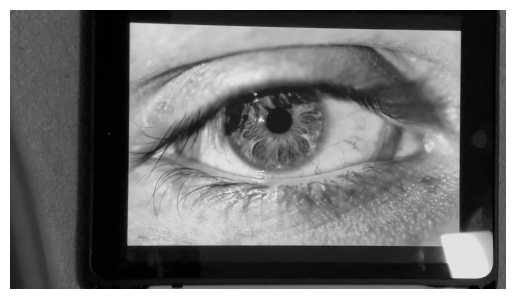

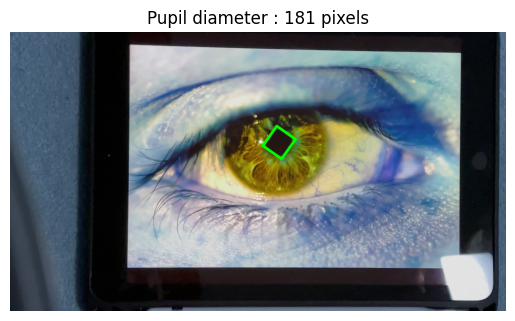

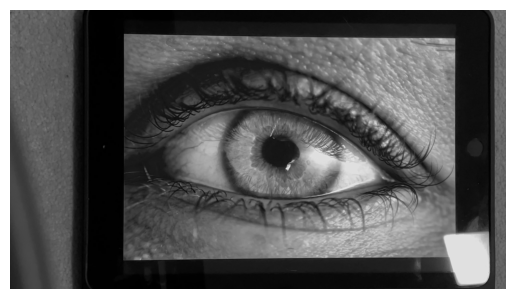

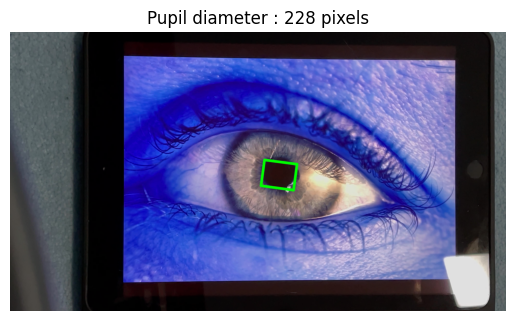

...

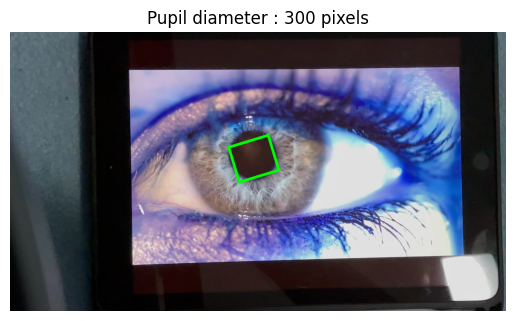

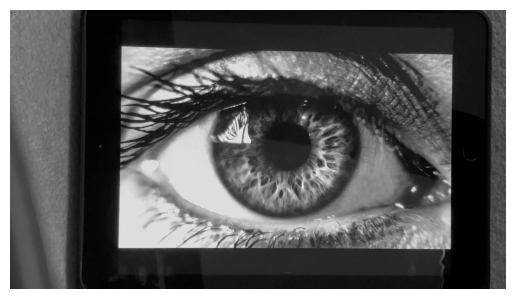

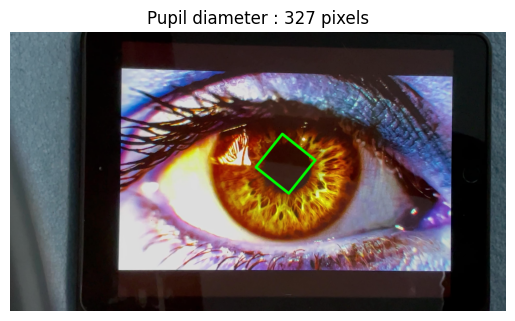

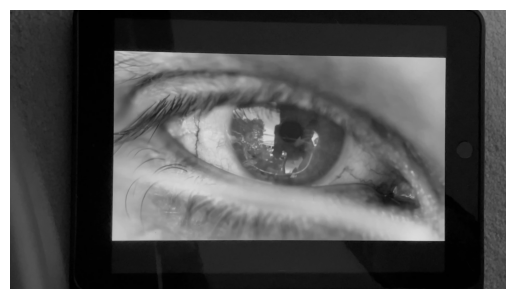

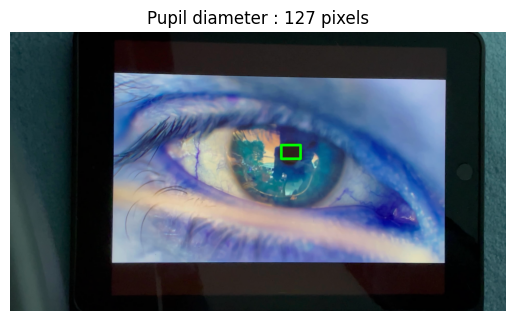

In [8]:
# Read the image as RGB mode
for image in rgbImages[:]:
    get_pupil(image)

## Tool

I used this code part to determine the threshold that could match for contouring pupil or iris.

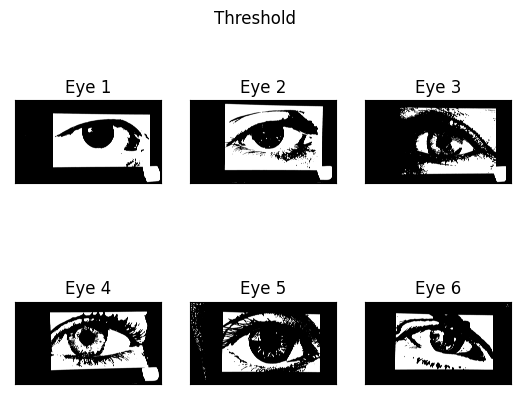

In [9]:
# threshdoldImages
method = cv.THRESH_BINARY
thres = 130

threshdoldImages = threshdold_images(grayImages, thres, method)
plot_images(threshdoldImages, 'gray', "Threshold")


## Display all the images in different formats

In [10]:
# initialize the raw pixel intensities matrix, the features matrix and labels list
grayImages = []
blurImages = []
biImages = []
edgedImages = []

# Setting All parameters for edge detection
t_lower = 0  # Lower Threshold
t_upper = 50  # Upper threshold
aperture_size = 5  # Aperture size

for image_path in imagePaths:
    # brg image
    brg = cv.imread(image_path) 
    bgrImages.append(brg)

    rgb = cv.cvtColor(brg, cv.COLOR_BGR2RGB)
    rgbImages.append(rgb)

    # gray image
    gray = cv.cvtColor(brg, cv.COLOR_RGB2GRAY)
    grayImages.append(gray)

    # blur image
    blur = cv.GaussianBlur(gray, (7, 7), 0)
    blurImages.append(blur)

    # bi
    bi = cv.bilateralFilter(gray, 3, 5, 5)
    biImages.append(bi)

    # Canny
    edged = cv.Canny(gray, t_lower, t_upper, aperture_size)
    edged = cv.dilate(edged, None, iterations=1)
    edged = cv.erode(edged, None, iterations=1) 
    edgedImages.append(edged)  

    """ # Circle Hough Detection
    rows = gray.shape[0]
    circles = cv.HoughCircles(gray, cv.HOUGH_GRADIENT, 1, rows / 8,
                               param1=100, param2=30,
                               minRadius=10, maxRadius=0)
    print(circles)
    
    
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            center = (i[0], i[1])
            # circle center
            cv.circle(rgb, center, 1, (0, 100, 100), 3)
            # circle outline
            radius = i[2]
            cv.circle(rgb, center, radius, (255, 0, 255), 3) 
    
    plt.imshow(rgb)
    plt.axis('off')
    plt.show() """

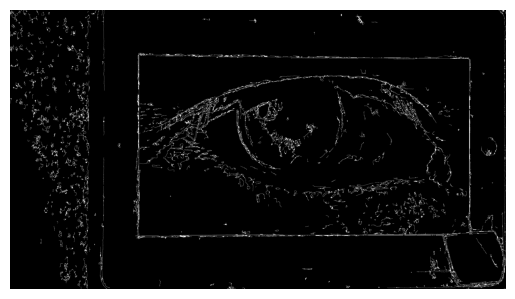

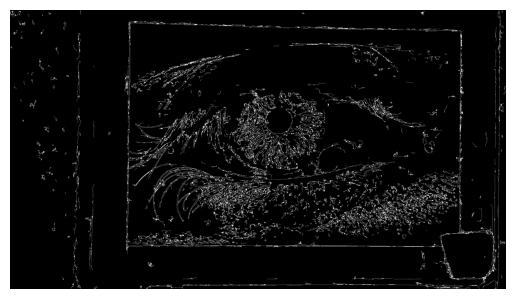

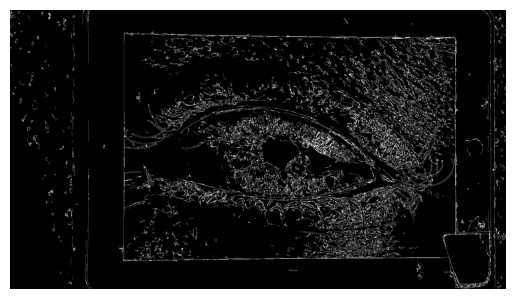

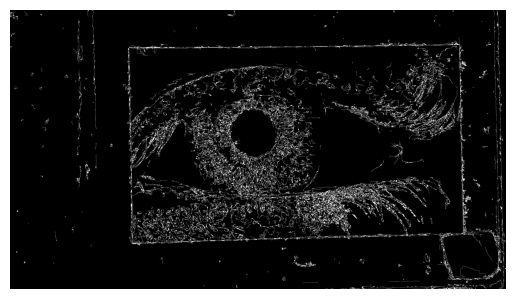

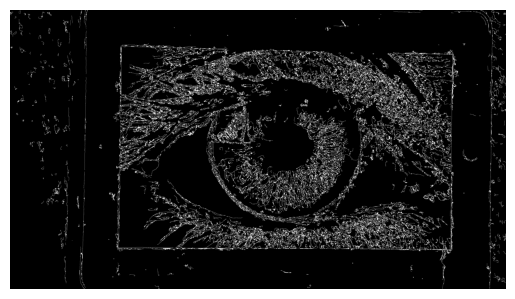

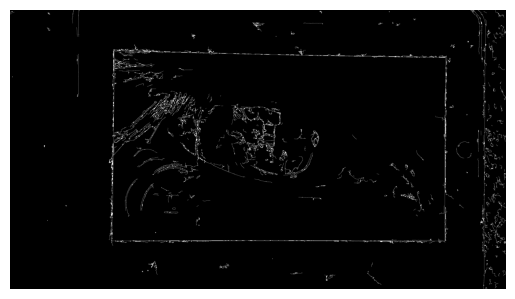

In [11]:
# Edged Images
for image in edgedImages:
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.show()

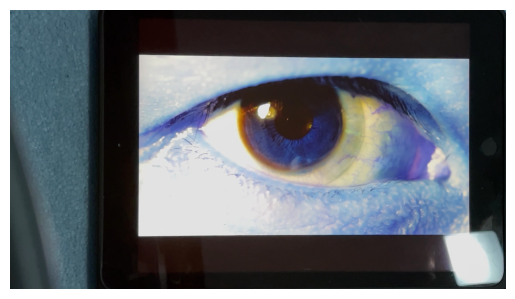

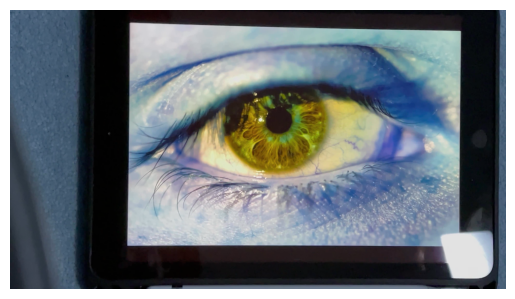

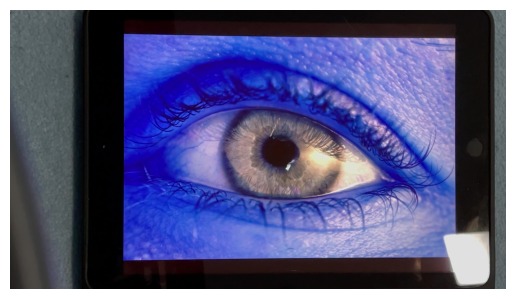

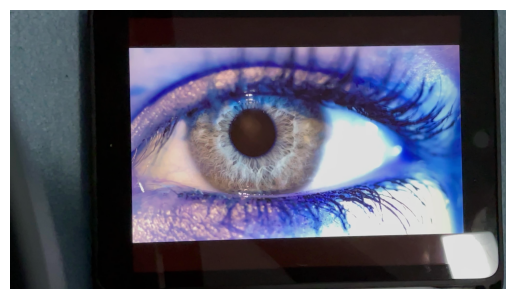

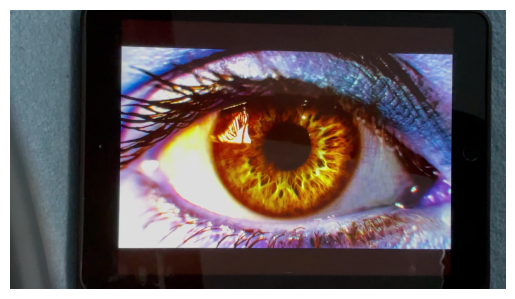

...

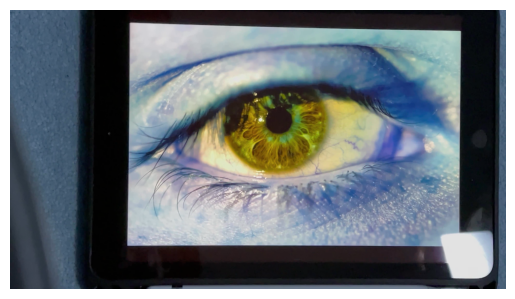

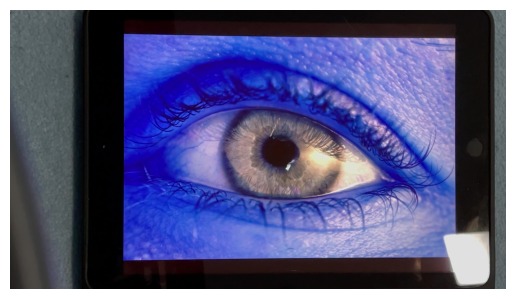

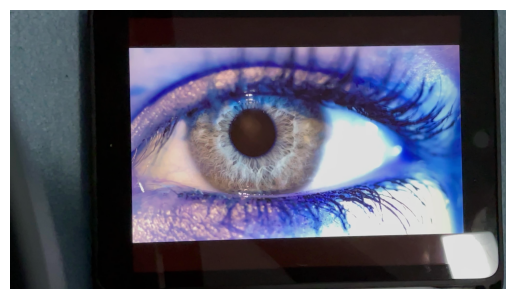

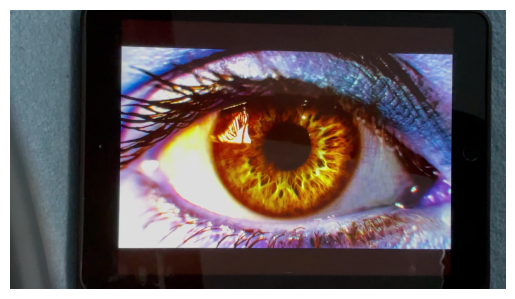

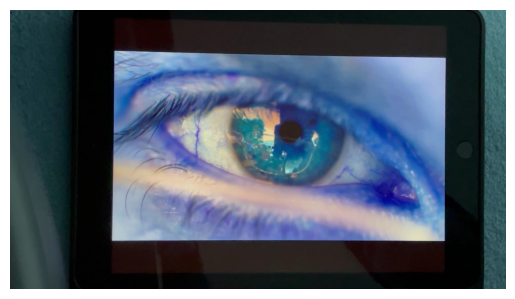

In [12]:
# BGR Images
for image in bgrImages:
    plt.imshow(image)
    plt.axis('off')
    plt.show()

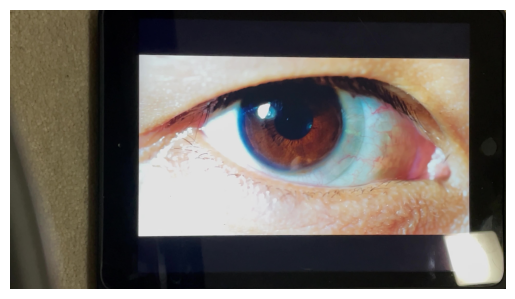

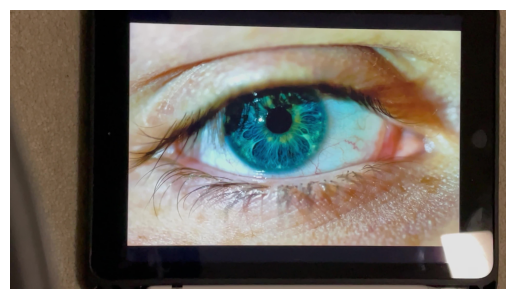

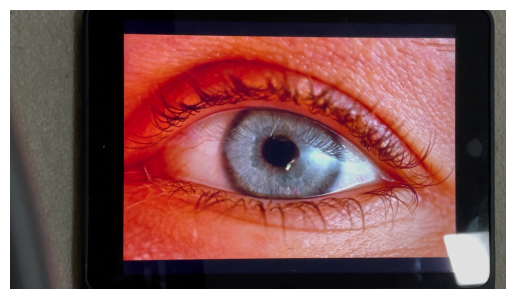

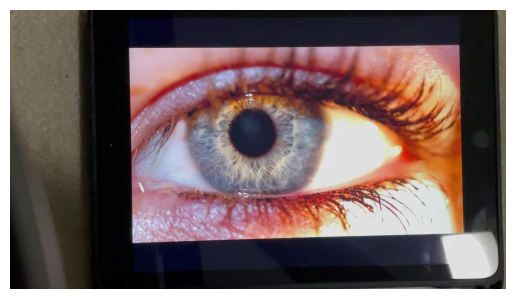

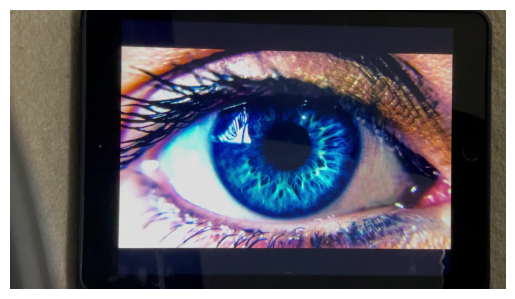

...

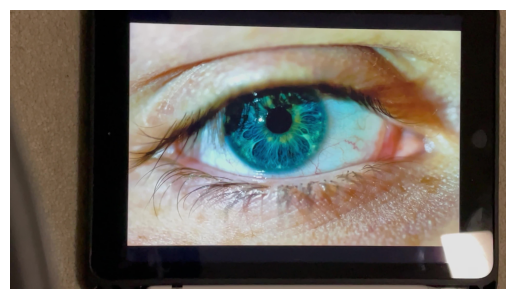

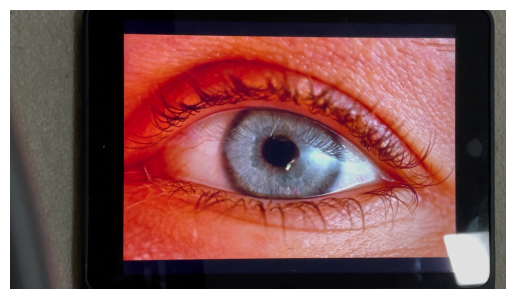

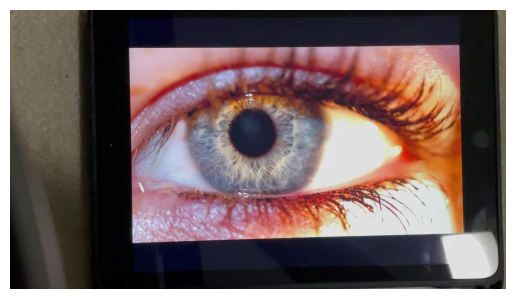

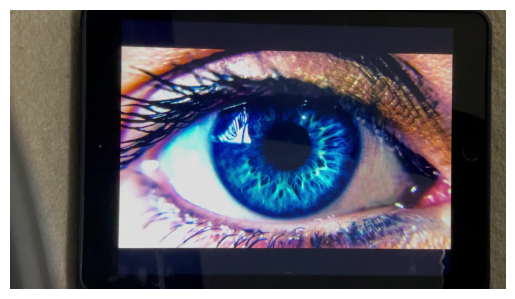

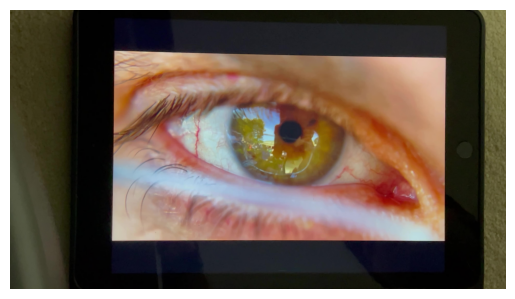

In [13]:
# RGB Images
for image in rgbImages:
    plt.imshow(image)
    plt.axis('off')
    plt.show()

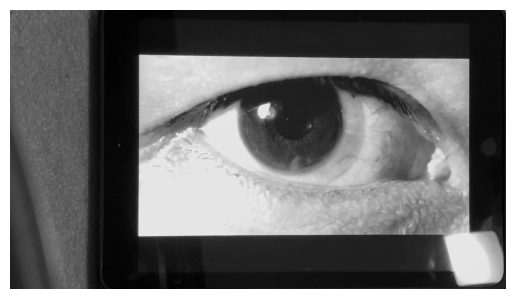

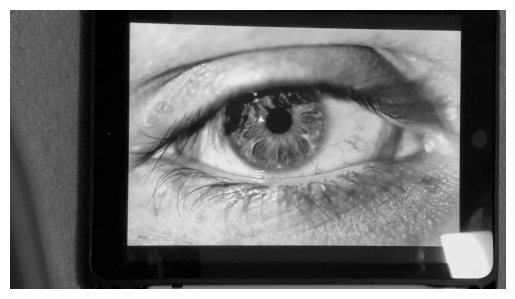

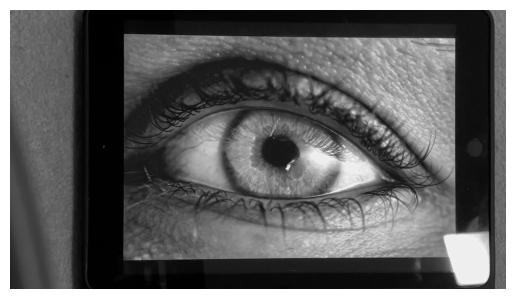

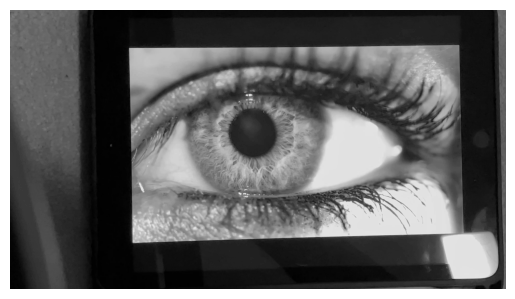

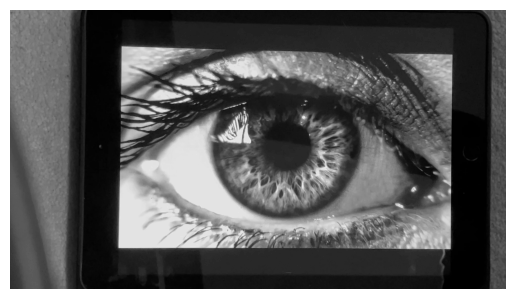

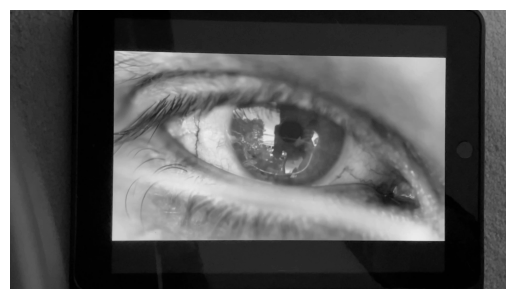

In [14]:
# Gray Images
for image in grayImages:
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.show()

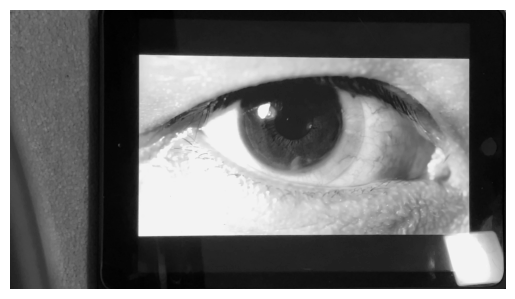

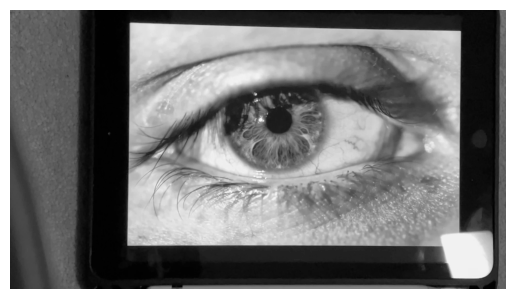

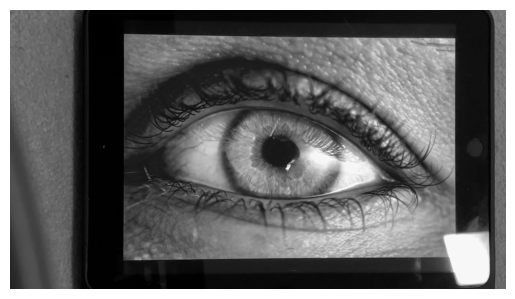

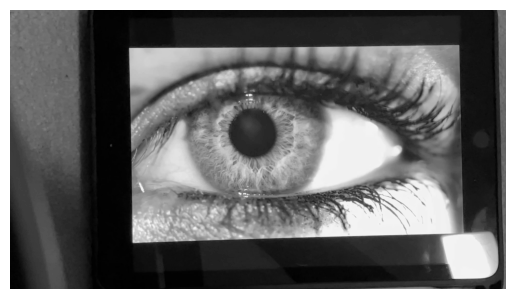

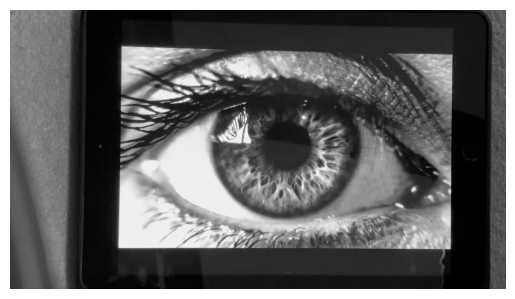

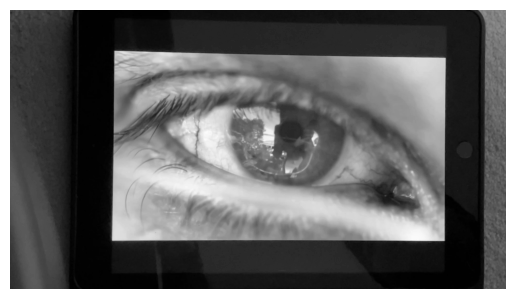

In [15]:
# Blur Images
for image in blurImages:
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.show()

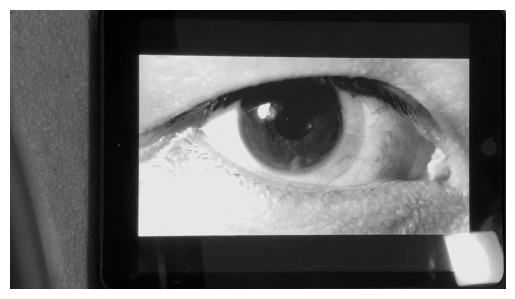

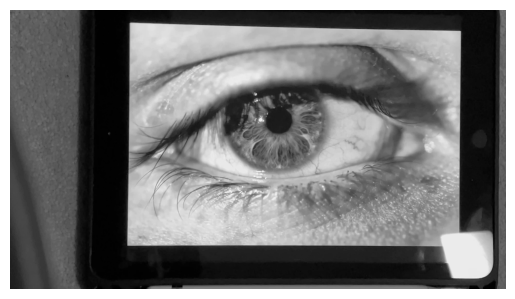

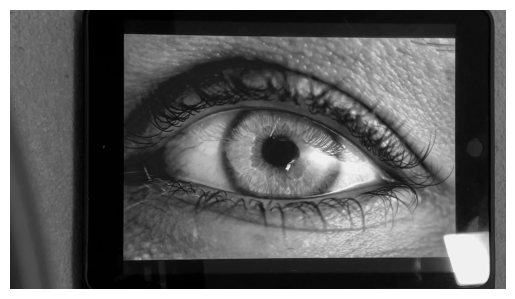

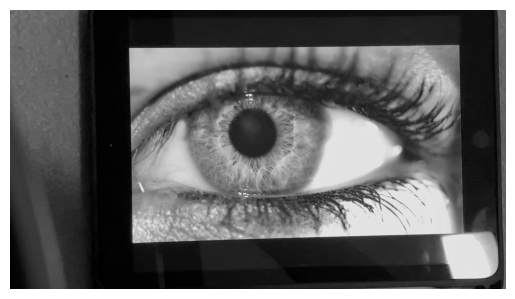

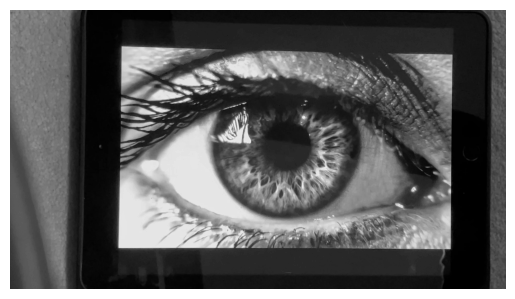

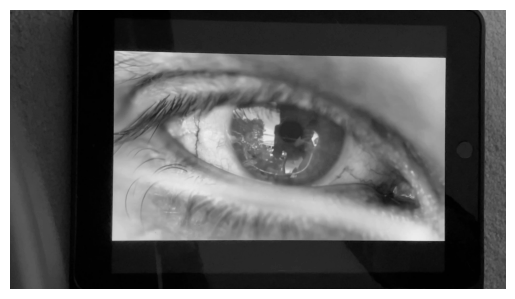

In [16]:
# Bilateral gray Images
for image in biImages:
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.show()